In [1]:
# %load_ext autoreload
# %autoreload 2

The autoreload module is not an IPython extension.


UsageError: Line magic function `%autoreload` not found.


In [153]:
import sys, os
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import anndata as ad
from scipy.stats import spearmanr, pearsonr

# from IPython.display import Audio
# tada = 'C://Users/stephanies/tada.mp3'

from celltype_mapping import TangramMapping, bin_gene_table, convert_to_anndata
from sawg import SpotTable

In [154]:
# set paths for data

# base network data path
data_path = '//allen/programs/celltypes/workgroups/rnaseqanalysis/NHP_spatial'

# save path
out_path = data_path + '/BGI/cDNAD5'

# spatial AnnData file
sp_anndata_file = out_path + '/macaque-cDNA5-bin100.h5ad'

# single cell AnnData file
sc_anndata_file = data_path + '/snRNAseq_data/macaque/macaque_MTG_raw.h5ad'

# bulkseq file
bulk_file  = data_path + '/bulkseq/macaque/QM22.26.030.MTG_abundance.tab'

# path for storing tangram mapping
tg_mapping_path = out_path + '/mapping'

In [155]:
spot_table = SpotTable.load_stereoseq(data_path + '/BGI/cDNAD5/macaque-cDNA5.gem', data_path + '/BGI/cDNAD5/macaque-cDNA5.gem.npz')

Loading from npz..


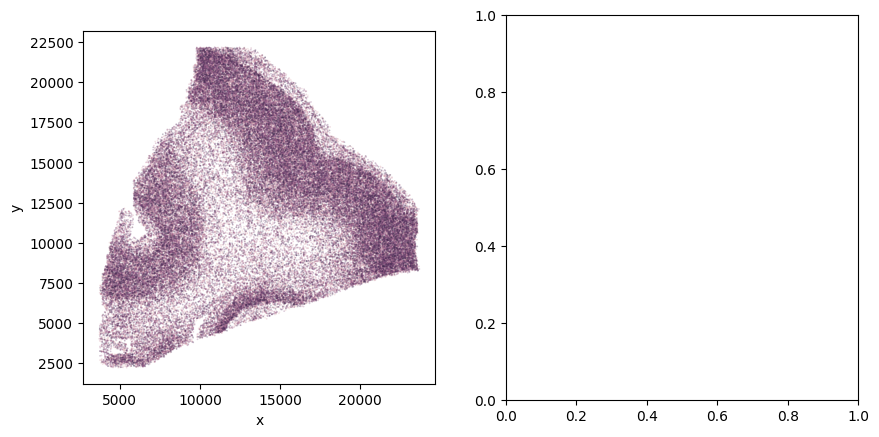

In [168]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
spot_table[::1000].scatter_plot(ax[0], alpha=0.3)
# sub = spot_table.get_subregion(xlim=(10000, 17500), ylim=(10000, 22000))
# sub.plot_rect(ax[0], 'r')
# sub[::100].scatter_plot(ax[1])

In [159]:
_, ad_sp_bin50 = convert_to_anndata(sp_data=spot_table, binsize=50)

Binning SpotTable at bin size 50..


  0%|          | 0/405 [00:00<?, ?it/s]

In [160]:
ad_sp_bin50.uns = {
    'chip': 'cDNAD5',
    'binsize': '50',
    'species': 'macaque',
    'region': 'MTG',
    'method': 'stereoseq'
}
ad_sp_bin50.write_h5ad(data_path + '/BGI/cDNAD5/ad_sp_bin50.h5ad')

If you already have data saved out TangramMapping class can be instantiated from those files

In [161]:
tg_map_bin50 = TangramMapping(
    sc_data=sc_anndata_file, 
    sp_data=ad_sp_bin50, 
    )

Select your training genes for Tangram

In [162]:
## select marker genes

neuron_marker_genes = pd.read_csv(data_path + '/snRNAseq_data/macaque/macaque_cluster_roc_markers.csv')
print(f'cluster marker genes: {len(neuron_marker_genes)}')
glia_marker_genes = pd.read_csv(data_path + '/snRNAseq_data/macaque/macaque_glia_cluster_roc_markers.csv')
print(f'glial marker genes: {len(glia_marker_genes)}')
marker_genes_df = neuron_marker_genes.append(glia_marker_genes)
marker_genes = marker_genes_df['gene'].to_list()
print(f'total marker genes: {len(marker_genes)}')

cluster marker genes: 7672
glial marker genes: 2512
total marker genes: 10184


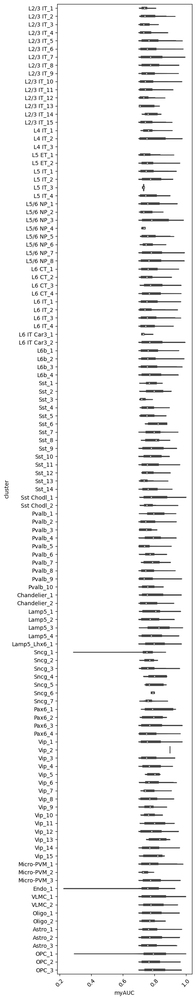

In [44]:
fig, ax = plt.subplots(figsize=(5, 25))
sns.violinplot(data=marker_genes_df, y='cluster', x='myAUC', ax=ax, cut=0, order=tg_map.ordered_labels['cluster'])
ax.tick_params(axis='x', labelrotation = 45)
# ax.set_xlabel('subclass')
plt.tight_layout()

In [163]:
# reduce to marker genes above median
marker_medians = marker_genes_df.groupby('cluster').median()
marker_genes_reduced = None
for cluster in marker_genes_df['cluster'].unique():
    thresh = marker_medians.loc[cluster]['myAUC']
    gene_filter = marker_genes_df[(marker_genes_df['cluster']==cluster) & (marker_genes_df['myAUC']>thresh)]
    if marker_genes_reduced is None:
        marker_genes_reduced = gene_filter
    else:
        marker_genes_reduced = marker_genes_reduced.append(gene_filter)
        
gene_list = marker_genes_reduced['gene'].tolist()

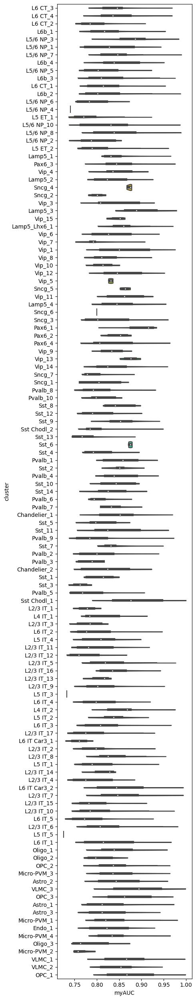

In [18]:
fig, ax = plt.subplots(figsize=(5, 25))
sns.violinplot(data=marker_genes_reduced, y='cluster', x='myAUC', ax=ax, cut=0)
# ax.tick_params(axis='x', labelrotation = 45)
# ax.set_xlabel('subclass')
plt.tight_layout()

In [45]:
training_genes = [g.upper() for g in tg_map.ad_sc.uns['training_genes']]
marker_genes_reduced['training_gene'] = marker_genes_reduced.apply(lambda x: x['gene'] in (training_genes), axis=1)
marker_genes_reduced.head()

,Unnamed: 0,myAUC,avg_diff,power,avg_logFC,pct.1,pct.2,cluster,gene,avg_log2FC,training_gene
0,TRPM3,0.969,1.631216,0.938,1.631216,0.997,0.464,L6 CT_3,TRPM3,NaN,True
1,GPR155,0.948,10.312796,0.896,10.312796,1.000,0.751,L6 CT_3,GPR155,NaN,True
2,LOC114678132,0.929,19.067666,0.858,19.067666,0.876,0.034,L6 CT_3,LOC114678132,NaN,False
3,LOC100429371,0.858,0.311285,0.716,0.311285,0.783,0.104,L6 CT_3,LOC100429371,NaN,False
4,ZNF704,0.849,1.599954,0.698,1.599954,0.993,0.830,L6 CT_3,ZNF704,NaN,True


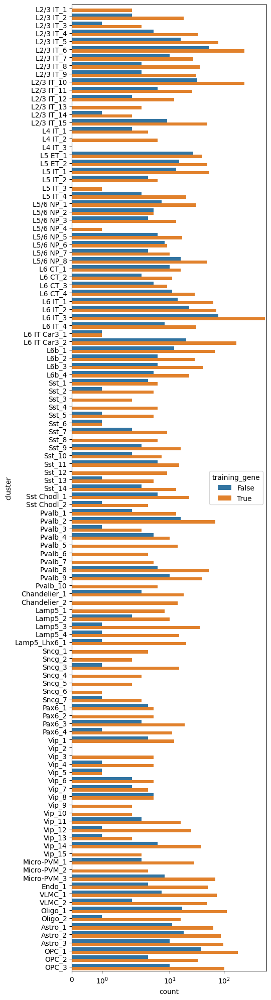

In [46]:
fig, ax = plt.subplots(figsize=(5, 25))
sns.countplot(data=marker_genes_reduced, y='cluster', hue='training_gene', ax=ax, order=tg_map.ordered_labels['cluster'])
ax.set_xscale('symlog')

In [164]:
tg_map_bin50.set_training_genes(gene_list, meta={'training_genes': 'cluster RNAseq markers above median ROC'})
# Audio(tada, autoplay=True)

starting with 5024 training genes..


INFO:root:2713 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:14160 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.


In [165]:
# run mapping with default settings:
# device='cpu', mode='clusters', cluster_label='subclass'

tg_map_bin50.mapping(cluster_label='cluster')
# Audio(tada, autoplay=True)

INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 2713 genes and rna_count_based density_prior in clusters mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.180, KL reg: 0.225
Score: 0.244, KL reg: 0.001
Score: 0.249, KL reg: 0.001
Score: 0.251, KL reg: 0.000
Score: 0.252, KL reg: 0.000
Score: 0.252, KL reg: 0.000
Score: 0.252, KL reg: 0.000
Score: 0.253, KL reg: 0.000
Score: 0.253, KL reg: 0.000
Score: 0.253, KL reg: 0.000


INFO:root:Saving results..


In [22]:
tg_map.meta

{'training_genes': 'cluster RNAseq markers above median ROC',
 'mode': 'clusters',
 'cluster_label': 'cluster'}

In [166]:
if not os.path.exists(tg_mapping_path):
    os.mkdir(tg_mapping_path)
tg_map_bin50.save_mapping(save_path=tg_mapping_path)

analysis UID: 1677602751.488


INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


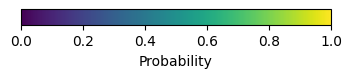

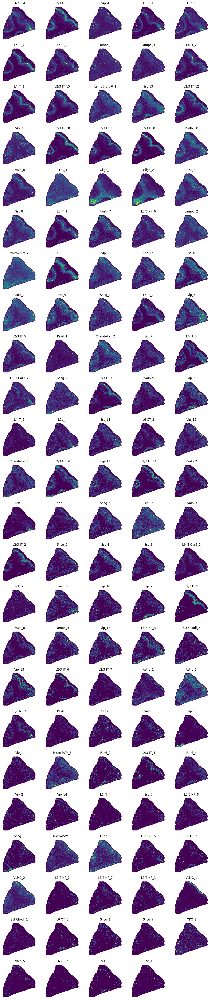

In [24]:
tg_map.plot_cell_probability()

INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


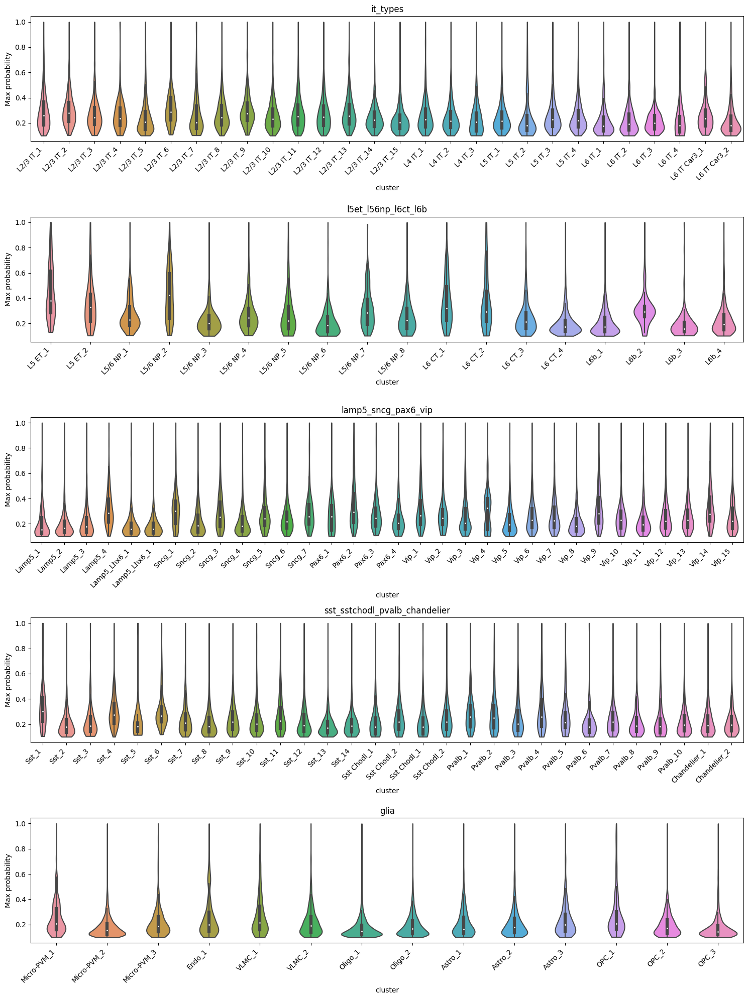

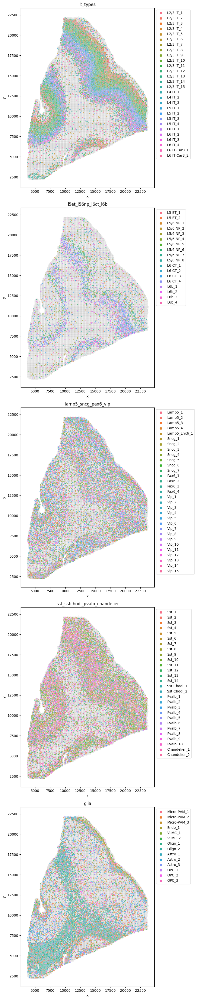

In [167]:
tg_map_bin50.get_discrete_cell_mapping(threshold=0.1)
neighborhoods = {}
neighborhoods_subclass = {}
for cls in ['exc', 'inh', 'glia']:
    for neighborhood in tg_map_bin50.ordered_labels[cls]:
        neighborhoods[neighborhood] = [cl for clusters in tg_map_bin50.ordered_labels[cls][neighborhood].values() for cl in clusters]
        neighborhoods_subclass[neighborhood] = [subclasses for subclasses in tg_map_bin50.ordered_labels[cls][neighborhood].keys()]

fig1 = tg_map_bin50.plot_discrete_mapping_probability(groups=neighborhoods)
fig2 = tg_map_bin50.plot_discrete_mapping(level='cluster', groups=neighborhoods)

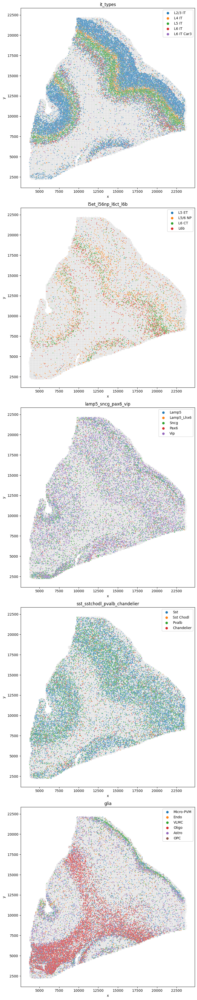

In [173]:
# fig1 = tg_map.plot_discrete_mapping_probability(groups=neighborhoods)
fig2 = tg_map_bin50.plot_discrete_mapping(level='subclass', groups=neighborhoods_subclass, args={'s': 5})

(12500.0, 22500.0)

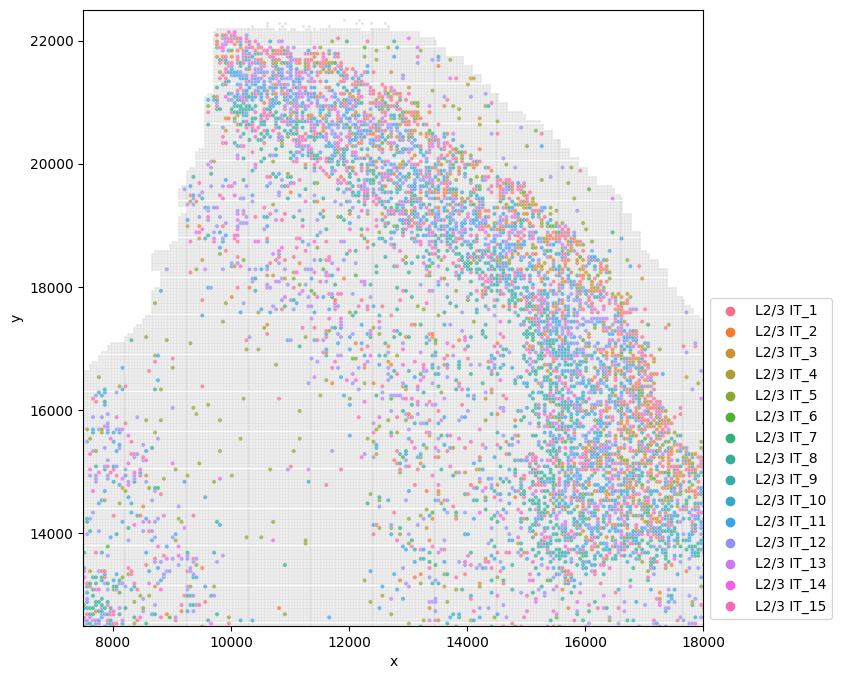

In [171]:
fig, ax = plt.subplots(figsize=(8,8))
sns.scatterplot(data=tg_map_bin50.ad_sp.obs, x='x', y='y', color='grey', alpha=0.2, s=5)
sns.scatterplot(data=tg_map_bin50.ad_sp.obsm['discrete_ct_pred'][tg_map_bin50.ad_sp.obsm['discrete_ct_pred']['subclass']=='L2/3 IT'], 
                x='x', y='y', hue='cluster', alpha=0.7, s=10,
               hue_order=[l for l in tg_map_bin50.ordered_labels['cluster'] if l.startswith('L2/3 IT')])
ax.legend(bbox_to_anchor=(1,0))
ax.set_xlim(7500, 18000)
ax.set_ylim(12500, 22500)

In [47]:
marker_exp = {}
marker_genes_training = marker_genes_reduced[marker_genes_reduced['training_gene']==True]
for cluster in marker_genes_reduced['cluster'].unique():
    genes = marker_genes_training[marker_genes_training['cluster']==cluster]['gene'].to_list()
    genes = [g.lower() for g in genes]
    if len(genes)==0:
        marker_exp[cluster] = 0
        continue
    cells = tg_map.ad_sp.obsm['discrete_ct_pred'][tg_map.ad_sp.obsm['discrete_ct_pred']['cluster']==cluster].index
    marker_exp[cluster] = tg_map.ad_sp[cells, genes].X.mean()
marker_exp_df = pd.DataFrame.from_dict(marker_exp, orient='index', columns=['avg_training_gene_expr'])
marker_exp_df.head()

,avg_training_gene_expr
L6 CT_3,0.738706
L6 CT_4,0.704368
L6 CT_2,0.265152
L6b_1,0.509564
L5/6 NP_3,0.333541


In [48]:
cluster_stats = pd.DataFrame(marker_genes_reduced.groupby('cluster')['training_gene'].sum())
cluster_stats.rename(columns={'training_gene': 'n_training_genes'}, inplace=True)
cluster_stats = cluster_stats.merge(marker_exp_df, left_index=True, right_index=True, how='outer')
cluster_stats.head()

,n_training_genes,avg_training_gene_expr
Astro_1,63,0.883646
Astro_2,88,1.288187
Astro_3,97,0.578622
Chandelier_1,18,0.364418
Chandelier_2,14,0.420957


In [49]:
tg_map.ad_map.obs.set_index('cluster', inplace=True)
cluster_stats = cluster_stats.merge(tg_map.ad_map.obs, left_index=True, right_index=True)
cluster_stats

,n_training_genes,avg_training_gene_expr,cluster_density
Astro_1,63,0.883646,0.002513
Astro_2,88,1.288187,0.011820
Astro_3,97,0.578622,0.002513
Chandelier_1,18,0.364418,0.005809
Chandelier_2,14,0.420957,0.009729
...,...,...,...
Vip_5,1,0.009434,0.014413
Vip_6,5,0.361538,0.006814
Vip_7,4,0.898230,0.003437
Vip_8,5,0.521499,0.010835


In [50]:
cluster_stats = cluster_stats.merge(pd.DataFrame(tg_map.ad_sp.obsm['discrete_ct_pred'].groupby('cluster')['cluster_prob'].median()),
                                                 left_index=True, right_index=True)
cluster_stats

,n_training_genes,avg_training_gene_expr,cluster_density,cluster_prob
Astro_1,63,0.883646,0.002513,0.259554
Astro_2,88,1.288187,0.011820,0.254261
Astro_3,97,0.578622,0.002513,0.316497
Chandelier_1,18,0.364418,0.005809,0.289278
Chandelier_2,14,0.420957,0.009729,0.312316
...,...,...,...,...
Vip_5,1,0.009434,0.014413,0.259093
Vip_6,5,0.361538,0.006814,0.312746
Vip_7,4,0.898230,0.003437,0.360959
Vip_8,5,0.521499,0.010835,0.308888


In [51]:
cluster_stats.corr()

,n_training_genes,avg_training_gene_expr,cluster_density,cluster_prob
n_training_genes,1.000000,-0.027598,0.028700,0.071531
avg_training_gene_expr,-0.027598,1.000000,0.068019,0.113590
cluster_density,0.028700,0.068019,1.000000,-0.317820
cluster_prob,0.071531,0.113590,-0.317820,1.000000


In [55]:
cluster_stats[cluster_stats.index.str.startswith('L2/3 IT')].sort_values('avg_training_gene_expr', ascending=False)

,n_training_genes,avg_training_gene_expr,cluster_density,cluster_prob
L2/3 IT_15,49,6.737044,0.020102,0.305920
L2/3 IT_1,2,1.411765,0.020102,0.385242
L2/3 IT_9,31,1.078341,0.003076,0.464349
L2/3 IT_4,33,0.936180,0.001689,0.530087
L2/3 IT_6,237,0.928648,0.002573,0.465958
L2/3 IT_11,26,0.903998,0.020102,0.392911
L2/3 IT_10,237,0.866723,0.020102,0.418219
L2/3 IT_5,78,0.806224,0.010574,0.304000
L2/3 IT_2,18,0.698284,0.004362,0.378525
L2/3 IT_12,12,0.671366,0.020102,0.335858


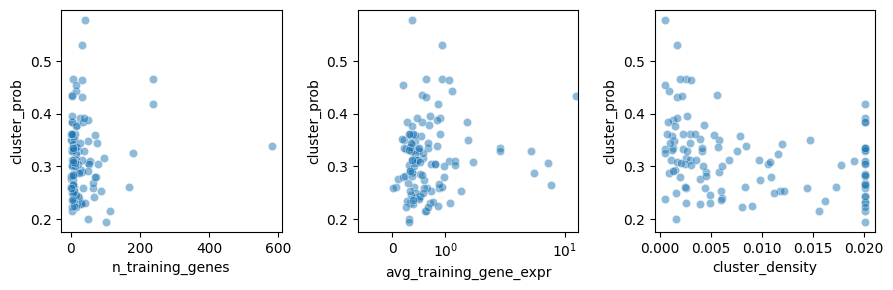

In [54]:
fig, ax = plt.subplots(1, 3, figsize=(9, 3))

sns.scatterplot(data=cluster_stats, x='n_training_genes', y='cluster_prob', alpha=0.5, lw=0, ax=ax[0])
# ax[0].set_xscale('symlog')
sns.scatterplot(data=cluster_stats, x='avg_training_gene_expr', y='cluster_prob', alpha=0.5, lw=0, ax=ax[1])
ax[1].set_xscale('symlog')
sns.scatterplot(data=cluster_stats, x='cluster_density', y='cluster_prob', alpha=0.5, lw=0, ax=ax[2])
plt.tight_layout()

In [58]:
cluster_corr = {}

clusters = tg_map.ad_sc.obs['cluster'].unique().to_list()
for cluster in clusters:
    marker_genes = marker_genes_reduced[marker_genes_reduced['cluster']==cluster]['gene'].to_list()
    marker_genes = [g.lower() for g in marker_genes if g.lower() in tg_map.ad_sp.uns['training_genes']]
    if len(marker_genes) == 0:
        continue
    ad_sp_cells = tg_map.ad_sp.obsm['discrete_ct_pred'][tg_map.ad_sp.obsm['discrete_ct_pred']['cluster']==cluster].index
    ad_sp_exp = tg_map.ad_sp[ad_sp_cells, marker_genes]
    ad_sc_cells = tg_map.ad_sc.obs[tg_map.ad_sc.obs['cluster']==cluster].index
    ad_sc_exp = tg_map.ad_sc[ad_sc_cells, marker_genes]
    corr, pval = spearmanr(np.log(ad_sp_exp.X.mean(axis=0)), np.log(ad_sc_exp.X.mean(axis=0)))
    cluster_corr[cluster] = {'corr': corr, 'pval': pval, 'n_training_genes': len(marker_genes)}

In [60]:
cluster_corr_df = pd.DataFrame(cluster_corr).T
# cluster_corr_df = cluster_corr_df.merge(sp_counts_cluster[['class', 'neighborhood']], left_index=True, right_index=True)
cluster_corr_df.head()

,corr,pval,n_training_genes
Micro-PVM_1,0.077502,6.950603e-01,28.0
Micro-PVM_2,-0.400000,6.000000e-01,4.0
Micro-PVM_3,0.610444,2.014045e-08,70.0
Endo_1,0.223039,1.194903e-01,50.0
VLMC_1,0.080731,4.941217e-01,74.0


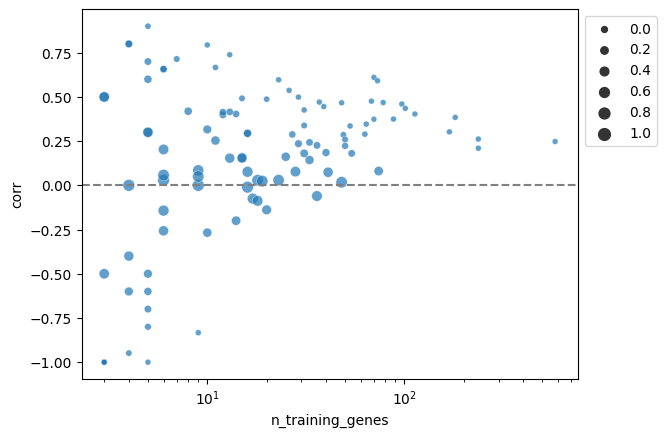

In [61]:
fig, ax = plt.subplots()
sns.scatterplot(data=cluster_corr_df, x='n_training_genes', y='corr', 
               alpha=0.7, size='pval')
ax.set_xscale('log')
ax.legend(bbox_to_anchor=(1,1))
ax.axhline(0, ls='--', c='grey')

In [74]:
def abline(slope, intercept, ax, args=None):
    """Plot a line from slope and intercept"""
    x_vals = np.array(ax.get_xlim())
    y_vals = intercept + slope * x_vals
    ax.plot(x_vals, y_vals, **args)

In [92]:
training_gene_exp = pd.DataFrame(tg_map.ad_sc[:, tg_map.ad_sc.uns['training_genes']].to_df().mean(), columns=['snRNAseq'])
training_gene_exp = training_gene_exp.merge(pd.DataFrame(tg_map.ad_sp[:, tg_map.ad_sp.uns['training_genes']].to_df().mean(), columns=['stereoseq']),
                                           left_index=True, right_index=True, how='outer')
for col in training_gene_exp.columns:
    training_gene_exp[col + ' log'] = np.log(training_gene_exp[col])
training_gene_exp.head()

,snRNAseq,stereoseq,snRNAseq log,stereoseq log
llgl2,0.098714,0.038566,-2.315526,-3.255380
cdc14a,0.262733,0.029797,-1.336617,-3.513333
adamts3,0.571728,0.099541,-0.559092,-2.307183
mapre2,2.180303,2.244875,0.779464,0.808650
homer1,3.984196,0.244956,1.382336,-1.406677


In [93]:
training_gene_exp.corr()

,snRNAseq,stereoseq,snRNAseq log,stereoseq log
snRNAseq,1.000000,0.147999,0.661750,0.319212
stereoseq,0.147999,1.000000,0.155624,0.471459
snRNAseq log,0.661750,0.155624,1.000000,0.512419
stereoseq log,0.319212,0.471459,0.512419,1.000000


In [148]:
cluster_markers = marker_genes_training[marker_genes_training['cluster'].isin(['L2/3 IT_8'])]['gene']
cluster_markers = [cm.lower() for cm in cluster_markers]

(0.003, 100.0)

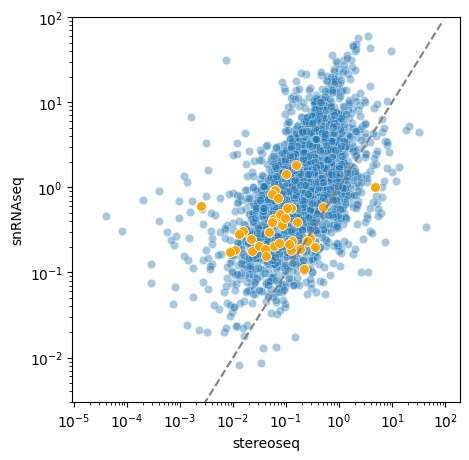

In [151]:
fig, ax = plt.subplots(figsize=(5,5))
sns.scatterplot(data=training_gene_exp, y='snRNAseq', x='stereoseq', alpha=0.4)
sns.scatterplot(data=training_gene_exp.loc[cluster_markers], y='snRNAseq', x='stereoseq', s=50, color='orange')
#                hue=training_gene_exp.loc[cluster_markers].index, palette='husl')
ax.set_yscale('log')
ax.set_xscale('log')
abline(1, 0, ax=ax, args={'ls':'--', 'c': 'grey'})
ax.set_ylim(3e-3, 1e2)

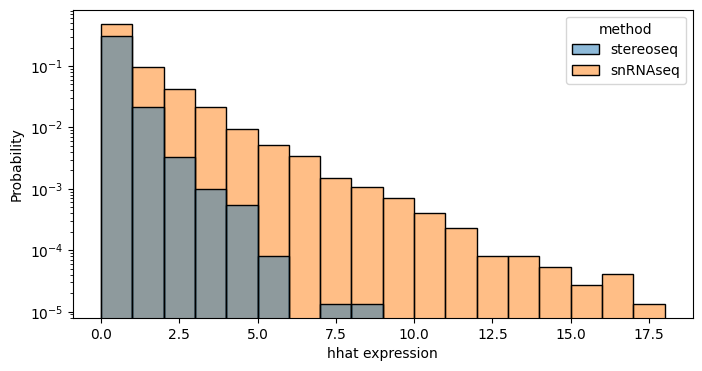

In [143]:
gene = 'hhat'
gene_dist_sp = tg_map.ad_sp[:, [gene]].to_df().rename(columns={gene: 'stereoseq'})
gene_dist_sc = tg_map.ad_sc[:, [gene]].to_df().rename(columns={gene: 'snRNAseq'})

gene_dist = pd.concat([gene_dist_sp, gene_dist_sc], axis=1).melt()
gene_dist.rename(columns={'value': f'{gene} expression', 'variable': 'method'}, inplace=True)

fig, ax = plt.subplots(figsize=(8, 4))
sns.histplot(gene_dist, x=f'{gene} expression', stat='probability', ax=ax, hue= 'method', binwidth=1)
ax.set_yscale('log')

In [138]:
gene_dist.head()

,stereoseq,snRNAseq
bin:3615_3786,0.0,NaN
bin:3615_3986,0.0,NaN
bin:3615_4086,0.0,NaN
bin:3615_4186,0.0,NaN
bin:3615_4286,0.0,NaN


In [37]:
n_types = tg_map.ad_map.X.shape[0]
most_likely_type = tg_map.ad_map.X.argmax(axis=0)

conf_matrix = [[] for i in range(n_types)]
for i in range(tg_map.ad_map.X.shape[1]):
    conf_matrix[most_likely_type[i]].append(tg_map.ad_map.X[:, i])
for i in range(n_types):
    conf_matrix[i] = np.stack(conf_matrix[i], axis=1).sum(axis=1)
    conf_matrix[i] /= conf_matrix[i].sum()
conf_matrix = np.array(conf_matrix)

diff = np.diag(conf_matrix) / conf_matrix.sum(axis=1)

In [22]:
most_likely_type[0]

19

In [24]:
tg_map.ad_map.X[:, 0]

array([3.72558127e-08, 7.87204435e-09, 8.40527381e-09, 4.16379820e-08,
       1.45333088e-08, 1.58433888e-08, 1.61623799e-08, 1.50494408e-08,
       8.17847265e-08, 1.08315685e-08, 4.30907976e-09, 4.77265445e-08,
       1.04114557e-08, 1.61423994e-08, 1.60367222e-08, 3.16153148e-08,
       8.78210571e-08, 5.74264547e-09, 2.70642042e-09, 1.00301705e-07,
       1.99932906e-08, 5.97529919e-08, 3.35244676e-09, 6.78068446e-08],
      dtype=float32)

In [38]:
diff

array([0.2438484 , 0.23723365, 0.250695  , 0.26871124, 0.2888277 ,
       0.27361134, 0.32644296, 0.32331976, 0.32595742, 0.33968583,
       0.3115374 , 0.30923468, 0.32350358, 0.29923353, 0.30582562,
       0.27556202, 0.23772317, 0.35291094, 0.33492893, 0.34016642,
       0.550062  , 0.35167027, 0.7910405 , 0.33137688], dtype=float32)